In [1]:
import json
import os
from pathlib import Path

from tqdm import tqdm
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

In [2]:
!pwd

/media/ashatya/Data/work/iit-bombay/doctr


In [13]:
labels_path = '../data/doctr-detection/Archive/val/labels.json'

In [3]:
annotations = json.load(open('../data/doctr-detection/Archive/val/labels.json'))

In [31]:
img_name = 'Va_da-Su_GS1-F[1-140]_8_ori.jpg'

In [38]:
_targets = [
    (f'{filename}_{word_num}',box)
    for filename in annotations
    for word_num,box in enumerate(annotations[filename]['polygons'])
]

In [40]:
text_targets, box_targets = zip(*_targets)

In [9]:
subfolder = '../data/doctr-detection/Archive/val/'
tmp_root = os.path.join(subfolder, "images")
message = "unpacking "+ 'Hindi' + " testset"
data = []
for img_path in tqdm(iterable=os.listdir(tmp_root), desc=message, total=len(os.listdir(tmp_root))):           
            
    # File existence check
    if not os.path.exists(os.path.join(tmp_root, img_path)):
        raise FileNotFoundError(f"unable to locate {os.path.join(tmp_root, img_path)}")

    
    _targets = [
        (f'{img_path}_{word_num}',box[0]+box[3])
        # print(word_num,box[0]+box[3])
        # for filename in text_data
        for word_num,box in enumerate(annotations[img_path]['polygons'])
    ]
    
    target_word_num, box_targets = zip(*_targets)
    
    data.append(
                    (
                        img_path,
                        dict(boxes=np.asarray(box_targets, dtype=np.float32), labels=list(target_word_num), images=list(target_word_num)),
                    )
                )

unpacking Hindi testset: 100%|██████████| 478/478 [00:00<00:00, 2037.56it/s]


In [10]:
data

[('ABBv1_1-109_0_ori.jpg',
  {'boxes': array([[ 574.,  147.,  782.,  180.],
          [ 790.,  147.,  940.,  180.],
          [ 948.,  147., 1047.,  180.],
          [1062.,  147., 1108.,  180.],
          [1116.,  147., 1162.,  180.],
          [ 555.,  233.,  593.,  266.],
          [ 601.,  233.,  661.,  266.],
          [ 669.,  233.,  766.,  266.],
          [ 775.,  233.,  953.,  266.],
          [ 969.,  233., 1014.,  266.],
          [1023.,  233., 1105.,  266.],
          [1120.,  233., 1181.,  266.],
          [ 513.,  411.,  829.,  457.],
          [ 844.,  422.,  884.,  455.],
          [ 899.,  422., 1196.,  455.],
          [1212.,  426., 1224.,  448.],
          [ 462.,  554.,  669.,  587.],
          [ 678.,  554.,  892.,  587.],
          [ 907.,  558.,  919.,  580.],
          [ 936.,  554.,  965.,  587.],
          [ 974.,  554., 1154.,  587.],
          [1161.,  554., 1276.,  587.],
          [ 567.,  767.,  671.,  800.],
          [ 680.,  767.,  705.,  800.],
    

In [11]:
annotations['Va_da-Su_GS1-F[1-140]_8_ori.jpg']['polygons'][0]

[[833, 334], [865, 334], [833, 365], [865, 365]]

In [28]:
img_path = Path(labels_path).parent.joinpath('images/Va_da-Su_GS1-F[1-140]_8_ori.jpg')

In [29]:
str(img_path)

'../data/doctr-detection/Archive/val/images/Va_da-Su_GS1-F[1-140]_8_ori.jpg'

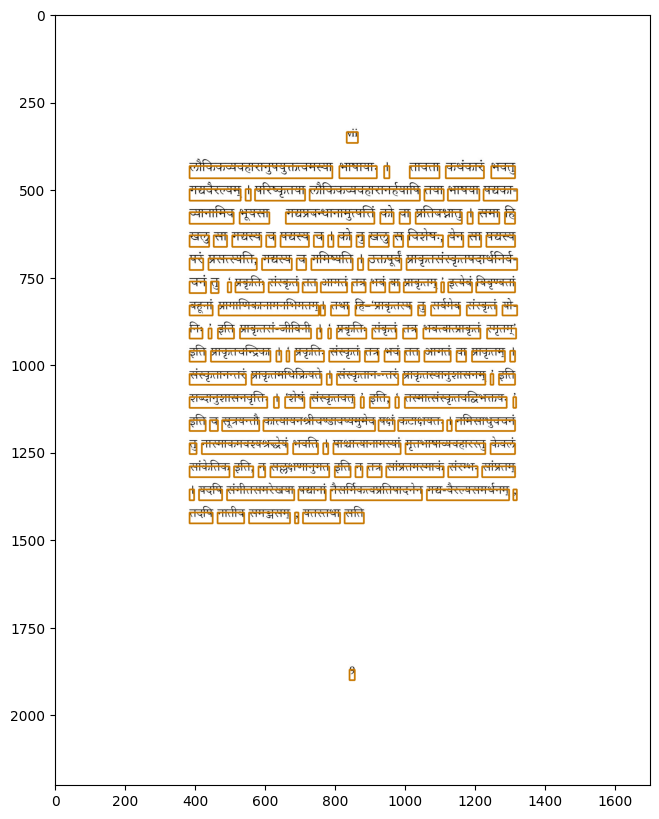

In [35]:
img = cv.imread(str(img_path))

for a1, b1, a2, b2 in annotations[img_name]['polygons']:
    cv.rectangle(img,a1,b2,(200,120,0),(3))
plt.figure(figsize=(30,10))
plt.imshow(img)